In [ ]:
# Libary untuk import Tensorflow dan MobileNetV2
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.applications import MobileNetV2

# Library untuk Melakukan hal hal Komputasi
import numpy as np
import pandas as pd

 # Library untuk visualisasi
import matplotlib.pyplot as plt
import cv2

# Library untuk mengelola di file os dan di google drive
import os
from glob import glob
from google.colab import drive

# Untuk menyambungkan ke google drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# memanggil dataset yang ada digoogle drive
home_dir = '/content/drive/MyDrive/Machine_Learning/dataset untuk belajar/Leaf Disease Dataset/base'
# home_dir = '/content/drive/MyDrive/Leaf Disease Dataset/base'

# mengubah dataset menjadi dataframe
import pathlib
def process(data):
  path = pathlib.Path(data)
  filepaths=list(path.glob(r"*/*.*"))
  labels=list(map(lambda x: os.path.split(os.path.split(x)[0])[1],filepaths))
  df1 = pd.Series(filepaths, name='filepaths').astype(str)
  df2 = pd.Series(labels, name='labels')
  df=pd.concat([df1, df2],axis=1)
  return df

# memasukkan dataframe home ke dalam variabel df_root
df_root= process(home_dir)

In [ ]:
os.listdir(home_dir)

['Brownspot', 'Tungro', 'Healthy', 'Bacterial blight', 'Blast']

In [ ]:
import os
import pathlib

# Direktori dataset Anda
home_dir = '/content/drive/MyDrive/Machine_Learning/dataset untuk belajar/Leaf Disease Dataset/base'

# Fungsi untuk mengambil semua format file unik dalam suatu direktori
def get_unique_file_formats(directory):
    # Membuat set kosong untuk menyimpan format file unik
    unique_formats = set()

    # Melintasi semua file dalam direktori
    for root, dirs, files in os.walk(directory):
        for file in files:
            # Mendapatkan ekstensi (format) file
            file_format = pathlib.Path(file).suffix.lower()
            # Menambahkannya ke set jika belum ada
            unique_formats.add(file_format)

    return unique_formats

# Mengambil semua format file unik dalam dataset Anda
unique_formats = get_unique_file_formats(home_dir)

# Menampilkan format-file yang ada
print("Format-file yang ada dalam dataset:")
for format in unique_formats:
    print(format)


Format-file yang ada dalam dataset:
.jpg


In [ ]:
df_root

,filepaths,labels
0,/content/drive/MyDrive/Machine_Learning/datase...,Brownspot
1,/content/drive/MyDrive/Machine_Learning/datase...,Brownspot
2,/content/drive/MyDrive/Machine_Learning/datase...,Brownspot
3,/content/drive/MyDrive/Machine_Learning/datase...,Brownspot
4,/content/drive/MyDrive/Machine_Learning/datase...,Brownspot
...,...,...
2821,/content/drive/MyDrive/Machine_Learning/datase...,Blast
2822,/content/drive/MyDrive/Machine_Learning/datase...,Blast
2823,/content/drive/MyDrive/Machine_Learning/datase...,Blast
2824,/content/drive/MyDrive/Machine_Learning/datase...,Blast


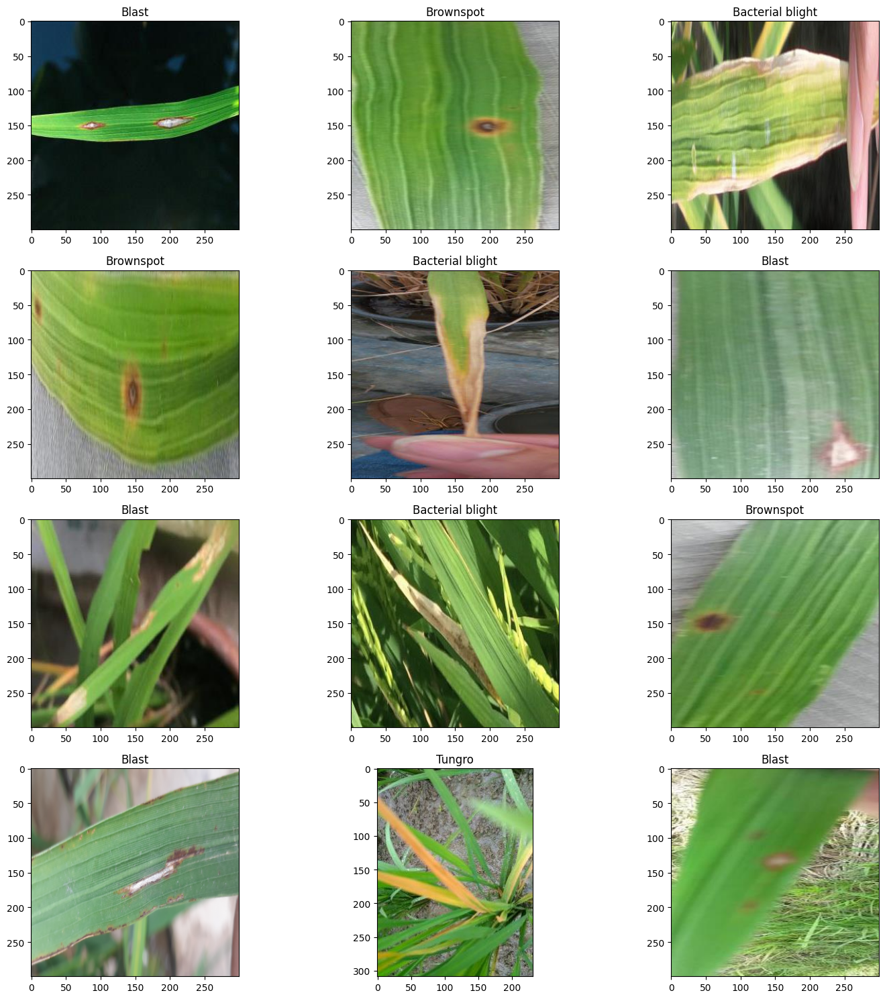

In [ ]:
df_root = df_root.sample(frac=1).reset_index(drop=True)
fig, axes=plt.subplots(nrows=4,ncols=3,figsize=(15,15))

for i,ax in enumerate(axes.flat):
  x=plt.imread(df_root['filepaths'][i])
  ax.imshow(x)
  ax.set_title(df_root['labels'][i])
plt.tight_layout()
plt.show()

In [ ]:
df_root['filepaths'][0]

'/content/drive/MyDrive/Machine_Learning/dataset untuk belajar/Leaf Disease Dataset/base/Brownspot/BROWNSPOT1_149.jpg'

Ukuran gambar: 1353 x 1353 x 3


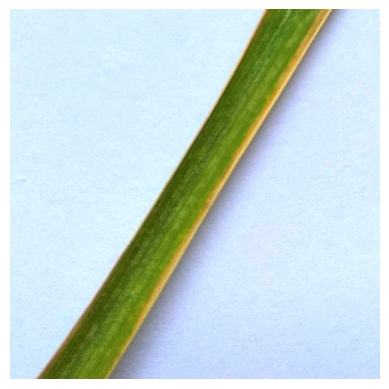

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Baca file gambar
file_path = df_root['filepaths'][900]  # Ganti dengan path file gambar yang sesuai
img = tf.io.read_file(file_path)
img = tf.image.decode_image(img)

# Dapatkan dimensi gambar
height, width, channels = img.shape

# Cetak dimensi gambar
print(f'Ukuran gambar: {width} x {height} x {channels}')

# Tampilkan gambar
plt.imshow(img)
plt.axis('off')  # Untuk menghilangkan sumbu
plt.show()


In [ ]:
healthy = (df_root.labels == 'Healthy').sum()
blast = (df_root.labels == 'Blast').sum()
tungro = (df_root.labels == 'Tungro').sum()
brownspot = (df_root.labels == 'Brownspot').sum()
bacterial = (df_root.labels == 'Bacterial blight').sum()



print("Label Healthy pada Dataset ada", healthy)
print("Label Leaf Blast pada Dataset ada", blast)
print("Label Tungro pada Dataset ada", tungro)
print("Label BrownSpot pada Dataset ada", brownspot)
print("Label Bacterial pada Dataset ada", bacterial)


Label Healthy pada Dataset ada 314
Label Leaf Blast pada Dataset ada 628
Label Tungro pada Dataset ada 628
Label BrownSpot pada Dataset ada 628
Label Bacterial pada Dataset ada 628


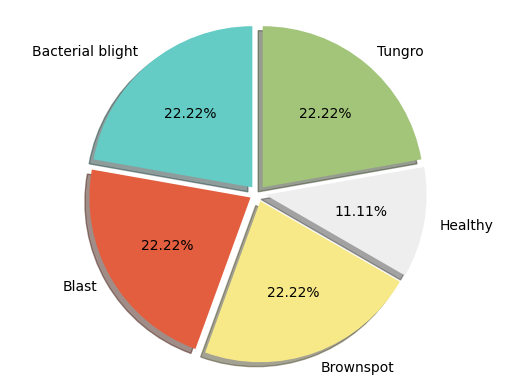

<Figure size 1000x800 with 0 Axes>

In [ ]:
# Membuat Visualisasi data dengan diagram pie chat
classes=['Bacterial blight', 'Blast', 'Brownspot', 'Healthy', 'Tungro']
labels = classes
sizes = [ bacterial, blast, brownspot, healthy, tungro]
colors =  ['#64CCC5','#E25E3E','#F7E987','#EEEEEE', '#A2C579']
explode = (0.05, 0.05,0.05, 0.05, 0.05)  # only "explode" the 2nd slice (i.e. 'Hogs')

fig1, ax1 = plt.subplots()
plt.figure(figsize=(10, 8))
ax1.pie(sizes, explode=explode, labels=labels, autopct='%0.2f%%',
        shadow=True, startangle=90, colors=colors)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

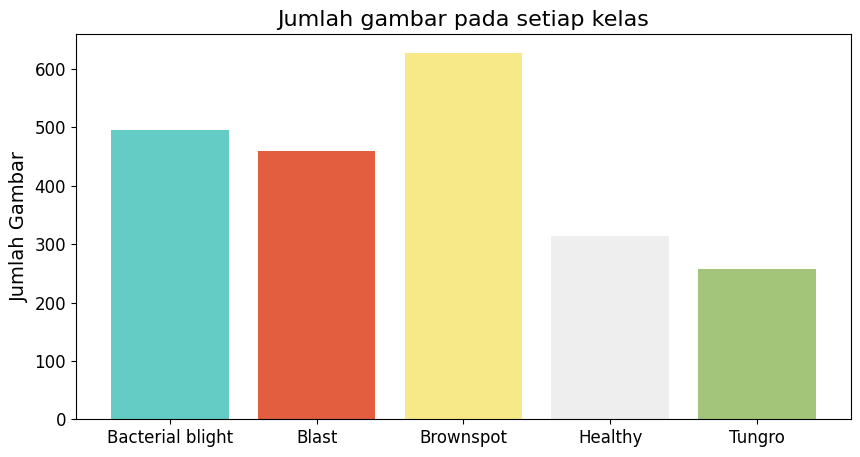

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

prodi = classes
jumlah_mhs = [bacterial, blast, brownspot, healthy, tungro]
colors =  ['#64CCC5','#E25E3E','#F7E987','#EEEEEE', '#A2C579']

plt.figure(figsize=(10,5))
plt.bar(prodi, jumlah_mhs, color=colors)

plt.title('Jumlah gambar pada setiap kelas', size=16)
plt.ylabel('Jumlah Gambar', size=14)
plt.xticks(size=12)
plt.yticks(size=12)

plt.show()

In [ ]:
# # Membagi Dataset
# from sklearn.model_selection import train_test_split

# train_df, test_df = train_test_split(home_dir, test_size=0.2, shuffle=True, random_state=1)
# test_df, validation_df = train_test_split(test_df, test_size=0.5, shuffle=True, random_state=1)

In [ ]:
# Membagi Dataset
from sklearn.model_selection import train_test_split

train_df, test_df = train_test_split(df_root, test_size=0.2, shuffle=True, random_state=1)
test_df, validation_df = train_test_split(test_df, test_size=0.5, shuffle=True, random_state=1)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale = 1./255,
                                   rotation_range = 30,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True,
                                   fill_mode='nearest')

train_set = train_datagen.flow_from_dataframe(dataframe= train_df,
                                              x_col='filepaths',
                                              y_col='labels',
                                              target_size = (224, 224),
                                              batch_size = 32,
                                              class_mode = 'categorical')

val_datagen = ImageDataGenerator(rescale = 1./255)

validation_set = val_datagen.flow_from_dataframe(dataframe= validation_df,
                                              x_col='filepaths',
                                              y_col='labels',
                                              target_size = (224, 224),
                                              batch_size = 32,
                                              class_mode = 'categorical')

test_datagen = ImageDataGenerator(rescale = 1./255)

test_set = test_datagen.flow_from_dataframe(dataframe= test_df,
                                            x_col='filepaths',
                                            y_col='labels',
                                            batch_size=len(test_df) ,
                                            color_mode='rgb',
                                            target_size = (224,224),
                                            class_mode = 'categorical')

Found 2260 validated image filenames belonging to 5 classes.
Found 283 validated image filenames belonging to 5 classes.
Found 283 validated image filenames belonging to 5 classes.


In [ ]:
len(train_set.next())

2

In [ ]:
train_set.samples

2260

In [ ]:
jumlah_data_awal = len(train_set.filepaths)


In [ ]:
jumlah_data_awal

1722

In [ ]:
classes=['Bacterial blight', 'Blast', 'Brownspot', 'Healthy', 'Tungro']

In [ ]:

for i in range(0,19):
    path_file_lengkap = train_set.filepaths[i]
    print(path_file_lengkap)
    train_set.filepaths[i]

/content/drive/MyDrive/Machine_Learning/dataset untuk belajar/Leaf Disease Dataset/base/Brownspot/BROWNSPOT2_041.jpg
/content/drive/MyDrive/Machine_Learning/dataset untuk belajar/Leaf Disease Dataset/base/Blast/BLAST2_013.jpg
/content/drive/MyDrive/Machine_Learning/dataset untuk belajar/Leaf Disease Dataset/base/Brownspot/brownspot_rotated_079.jpg
/content/drive/MyDrive/Machine_Learning/dataset untuk belajar/Leaf Disease Dataset/base/Tungro/TUNGRO2_090.jpg
/content/drive/MyDrive/Machine_Learning/dataset untuk belajar/Leaf Disease Dataset/base/Bacterial blight/BACTERAILBLIGHT3_089.jpg
/content/drive/MyDrive/Machine_Learning/dataset untuk belajar/Leaf Disease Dataset/base/Blast/BLAST3_076.jpg
/content/drive/MyDrive/Machine_Learning/dataset untuk belajar/Leaf Disease Dataset/base/Brownspot/BROWNSPOT5_127.jpg
/content/drive/MyDrive/Machine_Learning/dataset untuk belajar/Leaf Disease Dataset/base/Bacterial blight/BACTERAILBLIGHT3_085.jpg
/content/drive/MyDrive/Machine_Learning/dataset untuk

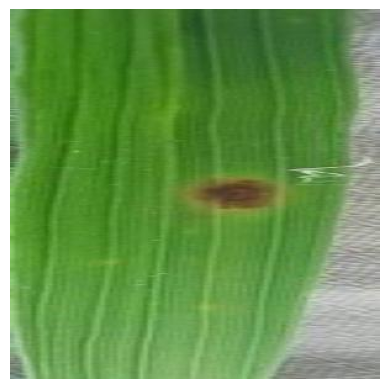

In [ ]:
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt

# Ganti 'gambar_asli.jpg' dengan path gambar asli Anda
original_image_path = '/content/drive/MyDrive/Machine_Learning/dataset untuk belajar/Leaf Disease Dataset/base/Brownspot/BROWNSPOT1_134.jpg'
img = image.load_img(original_image_path)
plt.imshow(img)
plt.axis('off')
plt.show()


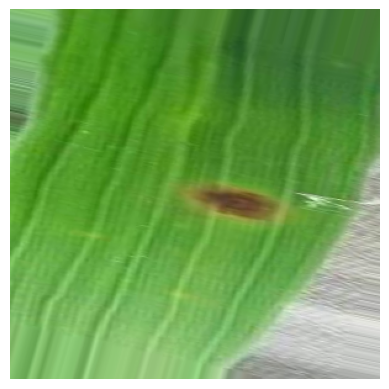

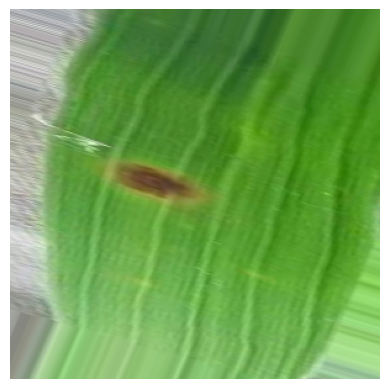

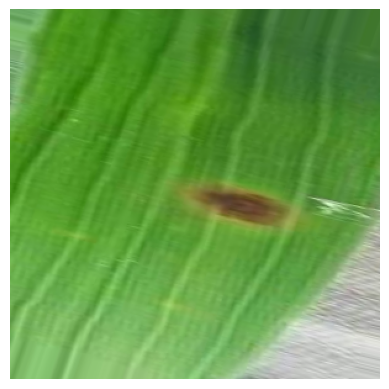

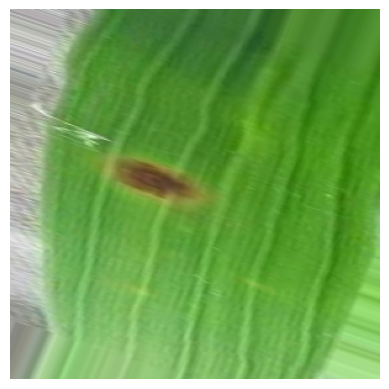

In [ ]:
img = image.load_img(original_image_path)
x = image.img_to_array(img)
x = x.reshape((1,) + x.shape)

i = 0
for batch in train_datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    plt.axis('off')
    i += 1
    if i % 4 == 0:
        break

plt.show()


In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt

# # Mengambil satu batch dari train_set
# images, labels = train_set.next()

# # Ambil nama file atau path file gambar dari dataframe
# paths = train_df['filepaths'][train_set.index_array]

# # Sekarang 'paths' berisi path file gambar sesuai dengan indeks batch yang sedang diakses

# # Menampilkan semua gambar beserta nama file
# for i in range(len(images)):
#     label = np.argmax(labels[i])
#     image = images[i]
#     path = paths[i]

#     # Menampilkan gambar
#     plt.subplot(1, len(images), i + 1)
#     plt.imshow(image)
#     plt.title(f"Label: {label}\nPath: {path}")

# plt.show()


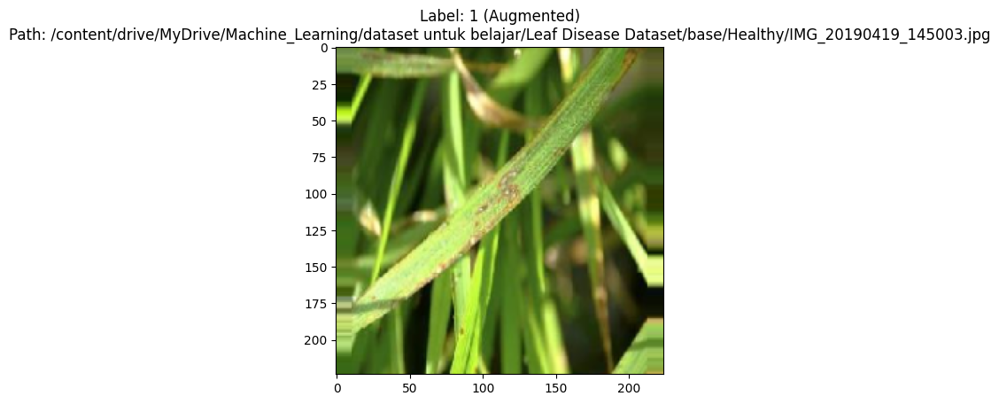

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Pilih indeks gambar yang ingin Anda tampilkan
index_to_display = 0  # Ganti dengan indeks gambar yang Anda inginkan

# Dapatkan path file gambar yang sesuai dari dataframe
path = train_df['filepaths'][train_set.index_array[index_to_display]]

# Mengambil satu batch dari train_set (data yang sudah di-augmentasi)
images_augmented, labels_augmented = train_set.next()

# Dapatkan gambar yang sesuai
label_augmented = np.argmax(labels_augmented[index_to_display])
image_augmented = images_augmented[index_to_display]

# Tampilkan gambar bersama dengan pathnya
plt.imshow(image_augmented)
plt.title(f"Label: {label_augmented} (Augmented)\nPath: {path}")
plt.show()


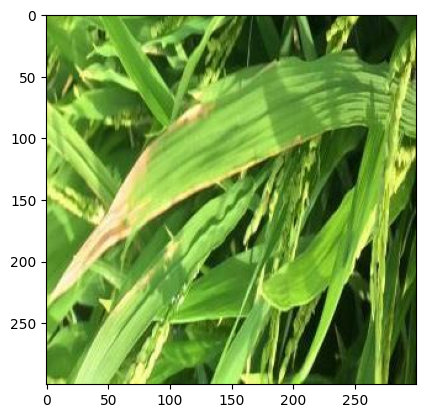

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# Tentukan path file gambar
path = "/content/drive/MyDrive/Machine_Learning/dataset untuk belajar/Leaf Disease Dataset/base/Bacterial blight/BACTERAILBLIGHT3_089.jpg"  # Gantilah dengan path sesuai dengan gambar yang ingin Anda buka

# Buka gambar dengan Pillow
image = Image.open(path)

# Menampilkan gambar
plt.imshow(image)
plt.show()

In [ ]:
# height = 224
# width = 224
# batch_size = 32
# seed = 32

# # Training generator
# train_datagen = ImageDataGenerator(
#     rescale=1. / 255,
#     rotation_range=40,
#     width_shift_range=0.2,
#     height_shift_range=0.2,
#     shear_range=0.2,
#     zoom_range=0.2,
#     horizontal_flip=True,
#     fill_mode='nearest')

# train_generator = train_datagen.flow_from_directory(
#     train_dir,
#     target_size=(height, width),
#     batch_size=batch_size,
#     seed=seed,
#     shuffle=True,
#     class_mode='categorical')

# # Test generator
# test_datagen = ImageDataGenerator(rescale=1. / 255)
# validation_generator = test_datagen.flow_from_directory(
#     test_dir,
#     target_size=(height, width),
#     batch_size=batch_size,
#     seed=seed,
#     class_mode='categorical')

In [ ]:
# # Feature Extraction Laye
# model = models.Sequential()
# model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(height, width, 3)))
# model.add(layers.MaxPooling2D((2, 2)))
# model.add(layers.Conv2D(32, (3, 3), activation='relu'))
# model.add(layers.MaxPooling2D((2, 2)))
# model.add(layers.Conv2D(64, (3, 3), activation='relu'))
# model.add(layers.MaxPooling2D((2, 2)))
# model.add(layers.Conv2D(64, (3, 3), activation='relu'))
# model.add(layers.MaxPooling2D((2, 2)))
# model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# model.add(layers.MaxPooling2D((2, 2)))

# # Flatten feature map
# model.add(layers.Flatten())
# model.add(layers.Dropout(0.2))

# # Fully Connected Layer
# model.add(layers.Dense(128, activation='relu'))
# model.add(layers.Dropout(0.5))
# model.add(layers.Dense(4, activation='softmax'))

# model.summary()

In [ ]:
# batch = train_set.next()

# # Memisahkan gambar dan label dari batch
# images, labels = batch

# # Mengambil gambar pertama dari batch (indeks 0)
# gambar_pertama = images[7]

# # Menampilkan gambar pertama
# plt.imshow(gambar_pertama)
# plt.title(f"Label: {labels[0]}")  # Menampilkan label yang sesuai
# plt.show()

In [ ]:
# image_shape = train_set.image_shape
# print("Ukuran gambar piksel: ", image_shape)

In [ ]:
# # Feature Extraction Layer
# model = models.Sequential()
# model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)))
# model.add(layers.MaxPooling2D((2, 2)))
# model.add(layers.Conv2D(32, (3, 3), activation='relu'))
# model.add(layers.MaxPooling2D((2, 2)))
# model.add(layers.Conv2D(64, (3, 3), activation='relu'))
# model.add(layers.MaxPooling2D((2, 2)))
# model.add(layers.Conv2D(64, (3, 3), activation='relu'))
# model.add(layers.MaxPooling2D((2, 2)))
# model.add(layers.Conv2D(128, (3, 3), activation='relu'))
# model.add(layers.MaxPooling2D((2, 2)))

# # Flatten feature map
# model.add(layers.Flatten())

# # Fully Connected Layer
# model.add(layers.Dense(128, activation='relu'))
# model.add(layers.Dense(256, activation='relu'))
# model.add(layers.Dropout(0.5))
# model.add(layers.Dense(4, activation='softmax'))

# model.summary()

# optimizers = tf.keras.optimizers.Adam(0.0001)

# model.compile(optimizer= optimizers ,loss = ('categorical_crossentropy'), metrics=['accuracy'])




In [ ]:
# Transfer Learning MobileNetV2
from tensorflow.keras.layers import Input

model = MobileNetV2(weights="imagenet", include_top=False,
                                input_tensor=Input(shape=(224, 224, 3)))


for layer in model.layers:
    layer.trainable = False

last_output = model.output


In [ ]:

# Layer Tambahan yang terdiri dari 1 layer konvolusi dan 3 layer dense
inputs = model.input
x = tf.keras.layers.AveragePooling2D(pool_size=(3, 3))(last_output)
x = tf.keras.layers.Flatten(name="flatten")(x)
x = tf.keras.layers.Dense(128, activation="relu")(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(5, activation="softmax")(x)

model = tf.keras.models.Model(model.input, x)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_2[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 112, 112, 32)         0         ['bn_Conv1[0][0]']      

In [ ]:
!pip install pydot graphviz


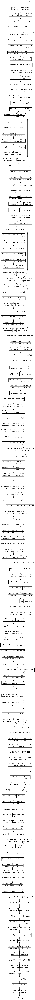

In [ ]:
from tensorflow.keras.utils import plot_model

# ... (kode untuk membangun model MobileNetV2 dan lapisan tambahan) ...

# Visualisasikan model
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)


In [ ]:
callback_cp = tf.keras.callbacks.ModelCheckpoint(
    filepath="/tmp/best-weights/weights-improvement-{epoch:02d}.hdf5", #hdf5 = h5 (versi singkat)
    monitor="val_accuracy",
    mode="max",
    verbose = 1,
    save_best_only=True,
)
callback_es = tf.keras.callbacks.EarlyStopping(monitor='loss', restore_best_weights=True, patience=20)

callbacks =[callback_cp, callback_es]

optimizers = tf.keras.optimizers.Adam(0.0001)
model.compile(optimizer= optimizers ,loss = ('categorical_crossentropy'), metrics=['accuracy'])
history = model.fit(train_set,
                    epochs=30,
                    validation_data= validation_set,
                    verbose=1,
                    callbacks = callbacks)

Epoch 1/30
71/71 [==============================] - ETA: 0s - loss: 0.7237 - accuracy: 0.7186
Epoch 1: val_accuracy improved from -inf to 0.89399, saving model to /tmp/best-weights/weights-improvement-01.hdf5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


71/71 [==============================] - 635s 9s/step - loss: 0.7237 - accuracy: 0.7186 - val_loss: 0.2905 - val_accuracy: 0.8940
Epoch 2/30
71/71 [==============================] - ETA: 0s - loss: 0.3118 - accuracy: 0.8894
Epoch 2: val_accuracy improved from 0.89399 to 0.91519, saving model to /tmp/best-weights/weights-improvement-02.hdf5
71/71 [==============================] - 56s 789ms/step - loss: 0.3118 - accuracy: 0.8894 - val_loss: 0.1948 - val_accuracy: 0.9152
Epoch 3/30
71/71 [==============================] - ETA: 0s - loss: 0.2267 - accuracy: 0.9133
Epoch 3: val_accuracy improved from 0.91519 to 0.95760, saving model to /tmp/best-weights/weights-improvement-03.hdf5
71/71 [==============================] - 57s 802ms/step - loss: 0.2267 - accuracy: 0.9133 - val_loss: 0.1413 - val_accuracy: 0.9576
Epoch 4/30
71/71 [==============================] - ETA: 0s - loss: 0.1755 - accuracy: 0.9389
Epoch 4: val_accuracy improved from 0.95760 to 0.96820, saving model to /tmp/best-weight

In [ ]:
# model.compile(optimizer= 'adam',loss = ('categorical_crossentropy'), metrics=['accuracy'])

# history = model.fit(train_generator,
#                     epochs=20,
#                     validation_data= validation_generator,
#                     verbose=2,
#                     validation_steps=5)

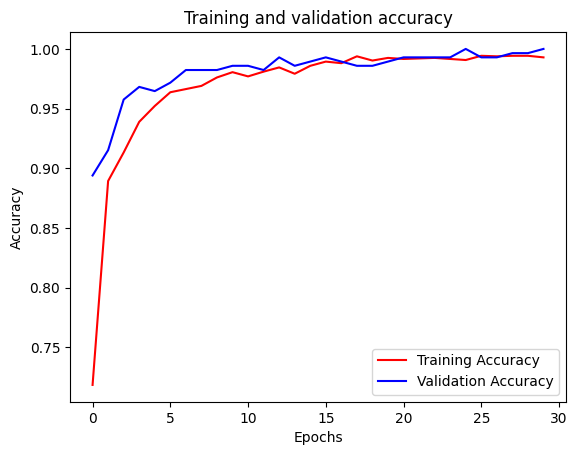

<Figure size 640x480 with 0 Axes>

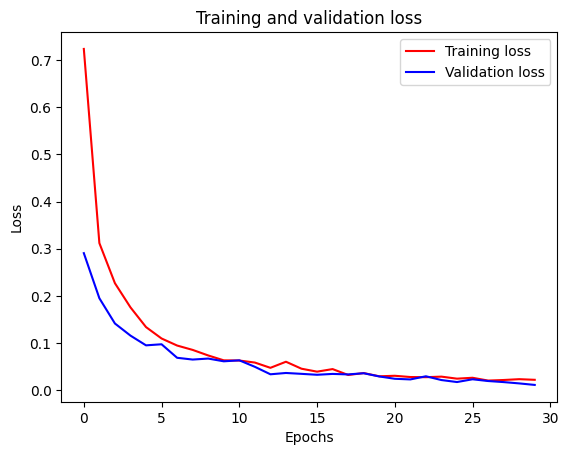

<Figure size 640x480 with 0 Axes>

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))

# Membuat grafik plot untuk accuracy
plt.plot(epochs, acc, 'r', label ='Training Accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation Accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc=0)
plt.figure()
plt.show()

# Membuat grafik plot untuk loss
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(loc=0)
plt.figure()
plt.show()

In [ ]:
results = model.evaluate(test_set, verbose=1)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

1/1 [==============================] - 4s 4s/step - loss: 0.0672 - accuracy: 0.9814
    Test Loss: 0.06722
Test Accuracy: 98.14%


In [ ]:
results = model.evaluate(test_set, verbose=1)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

1/1 [==============================] - 6s 6s/step - loss: 0.1401 - accuracy: 0.9541
    Test Loss: 0.14009
Test Accuracy: 95.41%


In [ ]:
model.evaluate(train_set)

71/71 [==============================] - 60s 842ms/step - loss: 0.0130 - accuracy: 0.9969


[0.012987185269594193, 0.9969026446342468]

In [ ]:
model.evaluate(test_set)

1/1 [==============================] - 6s 6s/step - loss: 0.0686 - accuracy: 0.9823


[0.0686156302690506, 0.982332170009613]

9/9 [==============================] - 0s 49ms/step


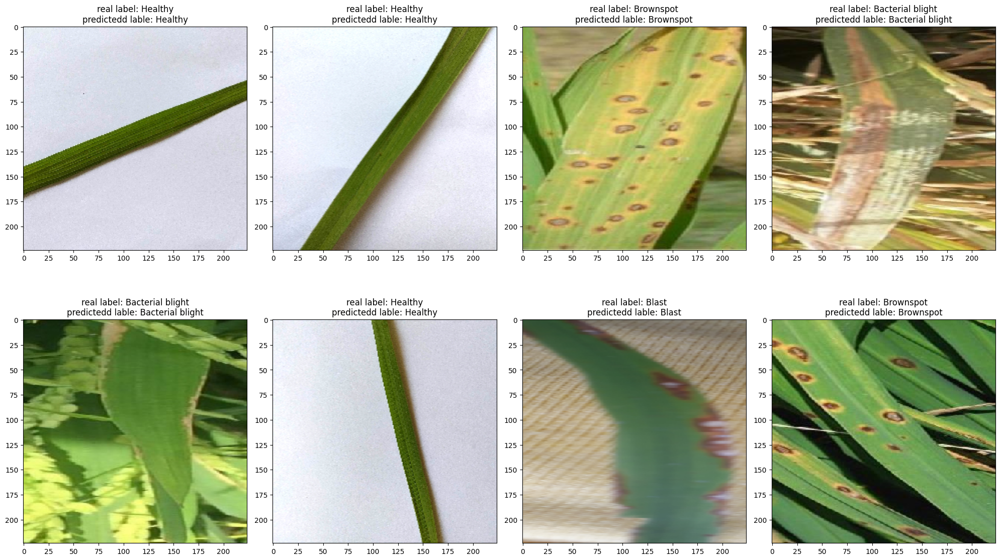

In [ ]:
classes = ['Bacterial blight', 'Blast', 'Brownspot', 'Healthy', 'Tungro']
images, labels = test_set.next()
preds = model.predict(images)
fig,axes=plt.subplots(nrows=2,ncols=4,figsize=(20,12))
dic={i:ax for i,ax in enumerate(axes.flat)}
for i in range(0,8):
    label = np.argmax(labels[i])
    pred = np.argmax(preds[i])
    image = images[i]
    dic[i].set_title("real label: " + str(classes[label]) + "\n" + "predictedd lable: " + str(classes[pred]))
    dic[i].imshow(image)
plt.tight_layout()
plt.show()

In [ ]:
from IPython.display import FileLink
model.save('/content/drive/MyDrive/Machine_Learning/dataset untuk belajar/modelSalinanSkripsiPercobaanSepuluhEpoch30DatasetBenerTerbaikSaatini.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
model = tf.keras.models.load_model('/content/drive/MyDrive/Machine_Learning/dataset untuk belajar/modelSalinanSkripsiPercobaanSepuluhEpoch30DatasetBenerTerbaikSaatini.h5')

7/7 [==============================] - 6s 745ms/step


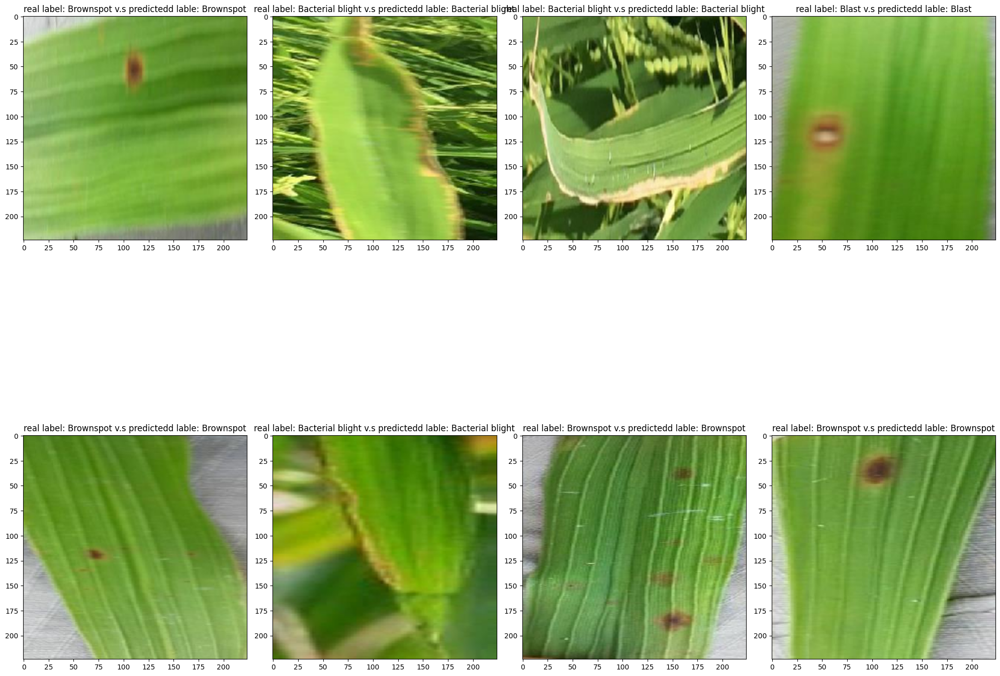

In [ ]:
classes = ['Bacterial blight', 'Blast', 'Brownspot', 'Healthy', 'Tungro']
images, labels = test_set.next()
preds = model.predict(images)
fig,axes=plt.subplots(nrows=2,ncols=4,figsize=(20,20))
dic={i:ax for i,ax in enumerate(axes.flat)}
for i in range(0,8):
    label = np.argmax(labels[i])
    pred = np.argmax(preds[i])
    image = images[i]
    dic[i].set_title("real label: " + str(classes[label]) + " v.s " + "predictedd lable: " + str(classes[pred]))
    dic[i].imshow(image)
plt.tight_layout()
plt.show()

In [ ]:
import seaborn as sns

1/1 [==============================] - 1s 1s/step - loss: 0.0033 - accuracy: 1.0000
Loss of the model is -  0.00331430253572762
Accuracy of the model is -  100.0 %
1/1 [==============================] - 1s 1s/step
                  precision    recall  f1-score   support

Bacterial blight       1.00      1.00      1.00        11
           Blast       1.00      1.00      1.00         6
       Brownspot       1.00      1.00      1.00         2
         Healthy       1.00      1.00      1.00         5
          Tungro       1.00      1.00      1.00         8

        accuracy                           1.00        32
       macro avg       1.00      1.00      1.00        32
    weighted avg       1.00      1.00      1.00        32



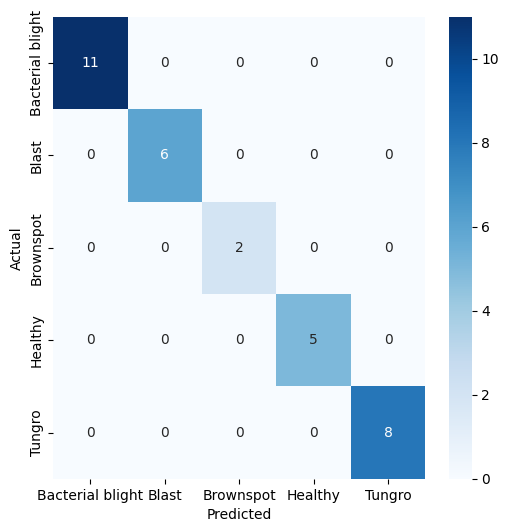

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix

def evaluate_model(model, test_set, class_names):
    test_images, test_labels = test_set.next()
    # Evaluasi model dan cetak loss serta akurasi
    loss, accuracy = model.evaluate(test_images, test_labels)
    print('Loss of the model is - ', loss)
    print('Accuracy of the model is - ', accuracy * 100, '%')

    # Prediksi kelas
    predictions = model.predict(test_images)
    predicted_classes = np.argmax(predictions, axis=1)

    # Laporan klasifikasi
    print(classification_report(np.argmax(test_labels, axis=1), predicted_classes, target_names=class_names))

    # Matriks konfusi
    conf_matrix = confusion_matrix(np.argmax(test_labels, axis=1), predicted_classes)

    # Plot matriks konfusi
    df_cm = pd.DataFrame(conf_matrix, index=class_names, columns=class_names)
    plt.figure(figsize=(6, 6))
    sns.heatmap(df_cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

# Contoh penggunaan:
# Misalnya, Anda memiliki test_set dalam bentuk tuple (test_images, test_labels)
# class_names adalah daftar nama kelas yang sesuai dengan indeks prediksi Anda
class_names = ['Bacterial blight', 'Blast', 'Brownspot', 'Healthy', 'Tungro']
evaluate_model(model, train_set, class_names)


9/9 [==============================] - 1s 56ms/step - loss: 0.0686 - accuracy: 0.9823
Loss of the model is -  0.0686156302690506
Accuracy of the model is -  98.2332170009613 %
9/9 [==============================] - 1s 40ms/step
                  precision    recall  f1-score   support

Bacterial blight       0.95      0.98      0.97        63
           Blast       0.97      0.97      0.97        61
       Brownspot       1.00      0.97      0.98        62
         Healthy       1.00      1.00      1.00        33
          Tungro       1.00      1.00      1.00        64

        accuracy                           0.98       283
       macro avg       0.98      0.98      0.98       283
    weighted avg       0.98      0.98      0.98       283



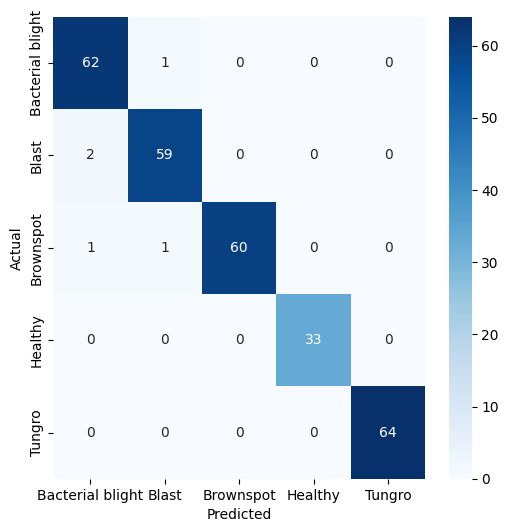

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix

def evaluate_model(model, test_set, class_names):
    test_images, test_labels = test_set.next()
    # Evaluasi model dan cetak loss serta akurasi
    loss, accuracy = model.evaluate(test_images, test_labels)
    print('Loss of the model is - ', loss)
    print('Accuracy of the model is - ', accuracy * 100, '%')

    # Prediksi kelas
    predictions = model.predict(test_images)
    predicted_classes = np.argmax(predictions, axis=1)

    # Laporan klasifikasi
    print(classification_report(np.argmax(test_labels, axis=1), predicted_classes, target_names=class_names))

    # Matriks konfusi
    conf_matrix = confusion_matrix(np.argmax(test_labels, axis=1), predicted_classes)

    # Plot matriks konfusi
    df_cm = pd.DataFrame(conf_matrix, index=class_names, columns=class_names)
    plt.figure(figsize=(6, 6))
    sns.heatmap(df_cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

# Contoh penggunaan:
# Misalnya, Anda memiliki test_set dalam bentuk tuple (test_images, test_labels)
# class_names adalah daftar nama kelas yang sesuai dengan indeks prediksi Anda
class_names = ['Bacterial blight', 'Blast', 'Brownspot', 'Healthy', 'Tungro']
evaluate_model(model, test_set, class_names)


Saving download (7).jpg to download (7).jpg
1/1 [==============================] - 0s 48ms/step
percentage:
0.97180563


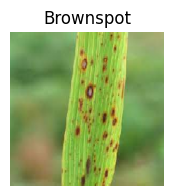

In [ ]:
class_dict = ['Bacterial blight', 'Blast', 'Brownspot', 'Healthy', 'Tungro']

from google.colab import files
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import numpy as np

uploads = files.upload()

n_files = len(uploads)
fig = plt.figure(figsize=(2, 2 * n_files))

for i, filename in enumerate(uploads):
  img = image.load_img(
      filename,
      target_size=(224, 224)
  )
  x = image.img_to_array(img)/255
  x = np.expand_dims(x, axis=0)

  predict = model.predict(x)

  class_prediction = np.argmax(predict)
  pee = predict[0][class_prediction]  # Probabilitas kelas yang diprediksi
  prediction = class_dict[class_prediction]


  ax = fig.add_subplot(n_files, 1, i+1)
  ax.imshow(img)
  ax.set_title(prediction)
  ax.axis(False)
  print('percentage:')
  print(pee)

In [ ]:
train_set.indeces